In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

student_mat = pd.read_csv('./archive/student_mat.csv') # (395, 33)
student_por = pd.read_csv('./archive/student_por.csv') # (649, 33)

In [2]:
student_mat.columns

Index(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
       'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime', 'studytime',
       'failures', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery',
       'higher', 'internet', 'romantic', 'famrel', 'freetime', 'goout', 'Dalc',
       'Walc', 'health', 'absences', 'G1', 'G2', 'G3'],
      dtype='object')

In [3]:
student_mat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      395 non-null    object
 1   sex         395 non-null    object
 2   age         395 non-null    int64 
 3   address     395 non-null    object
 4   famsize     395 non-null    object
 5   Pstatus     395 non-null    object
 6   Medu        395 non-null    int64 
 7   Fedu        395 non-null    int64 
 8   Mjob        395 non-null    object
 9   Fjob        395 non-null    object
 10  reason      395 non-null    object
 11  guardian    395 non-null    object
 12  traveltime  395 non-null    int64 
 13  studytime   395 non-null    int64 
 14  failures    395 non-null    int64 
 15  schoolsup   395 non-null    object
 16  famsup      395 non-null    object
 17  paid        395 non-null    object
 18  activities  395 non-null    object
 19  nursery     395 non-null    object
 20  higher    

In [4]:
student_por.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649 entries, 0 to 648
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      649 non-null    object
 1   sex         649 non-null    object
 2   age         649 non-null    int64 
 3   address     649 non-null    object
 4   famsize     649 non-null    object
 5   Pstatus     649 non-null    object
 6   Medu        649 non-null    int64 
 7   Fedu        649 non-null    int64 
 8   Mjob        649 non-null    object
 9   Fjob        649 non-null    object
 10  reason      649 non-null    object
 11  guardian    649 non-null    object
 12  traveltime  649 non-null    int64 
 13  studytime   649 non-null    int64 
 14  failures    649 non-null    int64 
 15  schoolsup   649 non-null    object
 16  famsup      649 non-null    object
 17  paid        649 non-null    object
 18  activities  649 non-null    object
 19  nursery     649 non-null    object
 20  higher    

In [7]:
student_mat.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10


In [8]:
student_por.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,4,0,11,11
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,2,9,11,11
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,6,12,13,12
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,0,14,14,14
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,0,11,13,13


---

# Student_mat data 살펴보기

C:\Users\SJang\AppData\Local\Temp\ipykernel_5792\1662755305.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_abs = abs(student_mat.corr(method='spearman'))


['G1' 'G2' 'G3' 'failures' 'Medu' 'Fedu' 'studytime' 'goout' 'Dalc' 'Walc'
 'traveltime' 'age' 'health' 'famrel' 'freetime']


<Axes: >

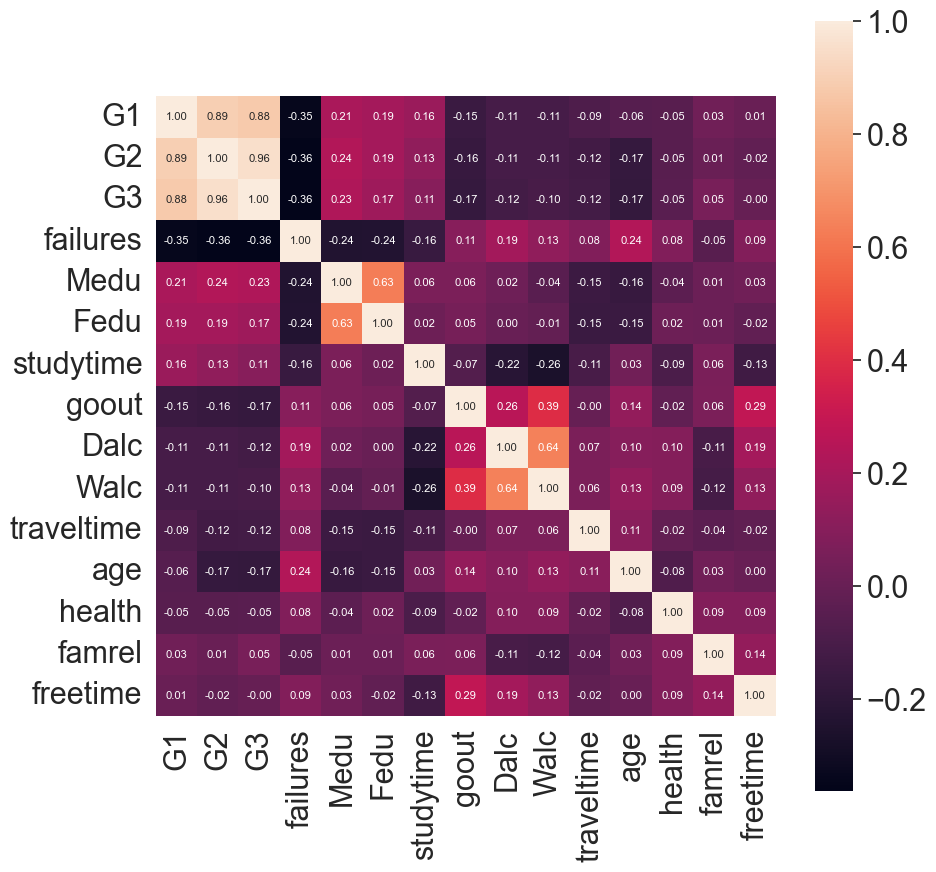

In [89]:
import scipy as sp
import seaborn as sns

cor_abs = abs(student_mat.corr(method='spearman'))

cor_cols = cor_abs.nlargest(n=15, columns='G1').index

# spearman coefficient matrix
cor = np.array(sp.stats.spearmanr(student_mat[cor_cols].values))[0] # 10 x 10
print(cor_cols.values)
plt.figure(figsize=(10,10))
sns.set(font_scale=2)
sns.heatmap(cor, fmt='.2f', annot=True, square=True, annot_kws={'size' : 8},
           xticklabels=cor_cols.values, yticklabels=cor_cols.values)

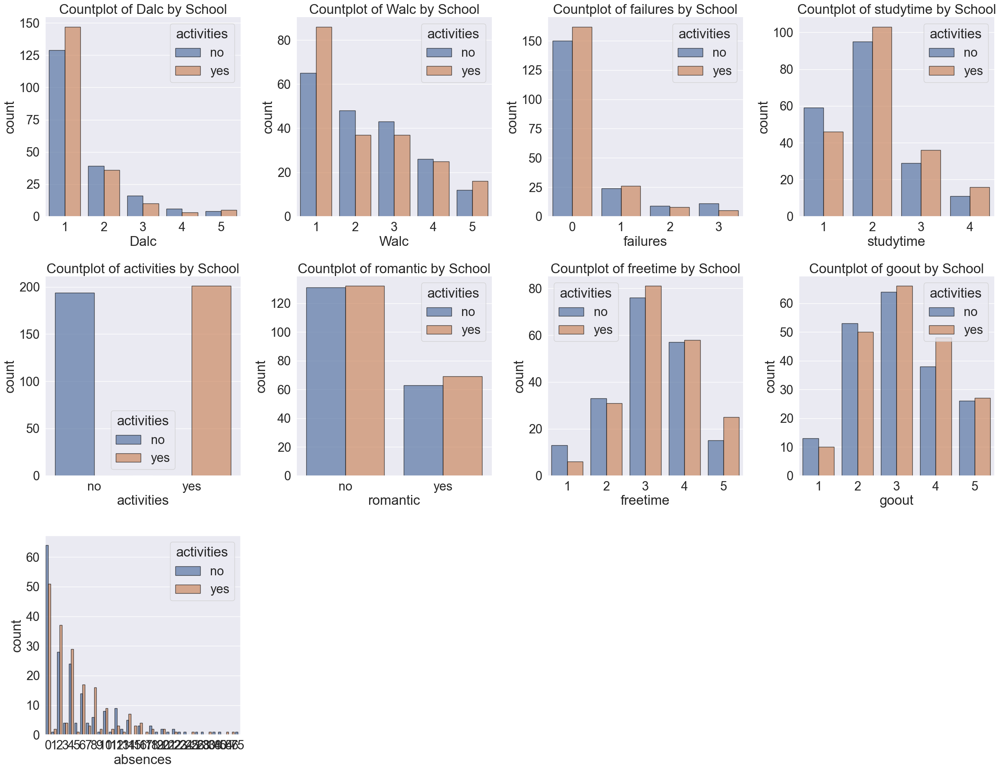

In [78]:
plt.figure(figsize=[25,25])
feature=['Dalc', 'Walc', 'failures', 'studytime',  'activities', 'romantic', 'freetime'
     , 'goout']
n=1
for f in feature:
    plt.subplot(4,4,n)
    sns.countplot(x=f, hue='activities', edgecolor="black", alpha=0.7, data=student_mat)
    sns.despine()
    plt.title("Countplot of {} by School".format(f))
    n=n+1

plt.subplot(4,4,9)
sns.countplot(x='absences', hue='activities', edgecolor='black', alpha=0.7, data=student_mat)
plt.tight_layout()
plt.show()

In [63]:
student_mat['school'].value_counts()

GP    349
MS     46
Name: school, dtype: int64

In [64]:
student_mat['Dalc'].value_counts()

1    276
2     75
3     26
5      9
4      9
Name: Dalc, dtype: int64

In [65]:
student_mat['Walc'].value_counts()

1    151
2     85
3     80
4     51
5     28
Name: Walc, dtype: int64

In [66]:
student_mat['failures'].value_counts()

0    312
1     50
2     17
3     16
Name: failures, dtype: int64

In [67]:
student_mat['studytime'].value_counts()

2    198
1    105
3     65
4     27
Name: studytime, dtype: int64

In [68]:
student_mat['activities'].value_counts()

yes    201
no     194
Name: activities, dtype: int64

In [69]:
student_mat['romantic'].value_counts()

no     263
yes    132
Name: romantic, dtype: int64

In [70]:
student_mat['freetime'].value_counts()

3    157
4    115
2     64
5     40
1     19
Name: freetime, dtype: int64

In [71]:
student_mat['goout'].value_counts()

3    130
2    103
4     86
5     53
1     23
Name: goout, dtype: int64

__성적이 낮은 학생들의 주된 이유가 뭘까? 성적을 3분할(excellent, good, bad)해서 bad에 해당하는 학생들의 특성을 파악해보고, excellent 학생들과 주된 차이가 나는 항목은 무엇인지 파악해보기__
* step 1 => excellnt(12-20), good (8-11), bad(0-7) 중 bad 에 해당하는 학생만 추출(iloc)
* step 2 => bad 학생들의 feature 분석
* step 3 => 시각화
* step 4 => excellent 학생 데이터 시각화
* step 5 => excellent vs bad 비교분석

## step1 bad & excellent 학생 데이터 추출

In [90]:
bad = student_mat.loc[(student_mat['G1']<8) & (student_mat['G2']<8) & (student_mat['G3']<8)]
bad.shape

(43, 33)

In [196]:
increased_G3 = student_mat.loc[(student_mat['G1']<8) & (student_mat['G2']<8) & (student_mat['G3']>11)]
increased.shape

(0, 33)

In [198]:
increased_G23 = student_mat.loc[(student_mat['G1']<8) & (student_mat['G2']>11) & (student_mat['G3']>11)]
increased.shape

(0, 33)

In [199]:
increased_G23 = student_mat.loc[(student_mat['G1']<8) & (student_mat['G2']>11) & (student_mat['G3']<8)]
increased.shape

(0, 33)

__신입생때 성적이 안좋았지만 학년이 올라가면서 성적이 점점 좋아진 학생 없음__

## step2 bad 학생들의 feature 분석

__노력의 영역__

In [119]:
bad['Dalc'].value_counts().sort_index()

1    30
2    10
3     1
4     1
5     1
Name: Dalc, dtype: int64

In [120]:
bad['Walc'].value_counts().sort_index()

1    17
2    12
3     6
4     5
5     3
Name: Walc, dtype: int64

In [121]:
bad['failures'].value_counts().sort_index()

0    22
1    10
2     5
3     6
Name: failures, dtype: int64

낙제 횟수에 4가 없는게 의외.

In [122]:
bad['studytime'].value_counts().sort_index()

1    19
2    19
3     4
4     1
Name: studytime, dtype: int64

1~2가 38명으로 bad 학생의 대부분이 공부시간이 적다.
공부 열심히 하는데 안나오는 친구 5명

In [123]:
bad['reason'].value_counts().sort_index()

course        18
home           9
other          4
reputation    12
Name: reason, dtype: int64

학교 명성과 선호하는 수업이 있어서 학교를 고른 친구가 대부분. 무슨 학교를 다닐까?

In [124]:
bad['school'].value_counts().sort_index()

GP    35
MS     8
Name: school, dtype: int64

GP를 다니는 학생이 많음. GP가 학구율이 높은 학교인가? 라고 생각하기엔 애초에 GP를 다니는 학생수(349명)가 MS를 다니는 학생수(46명)보다 월등히 많음
bad에 속한 학생은 GP 학교의 하위 10%, NP 학교의 하위 17프로 학생임

In [125]:
bad['activities'].value_counts().sort_index()

no     24
yes    19
Name: activities, dtype: int64

다른 활동을 하는 친구과 안하는 친구 수는 비슷비슷

In [126]:
bad['higher'].value_counts().sort_index()

no      6
yes    37
Name: higher, dtype: int64

잘하고자 하는 욕구는 있음.

In [127]:
bad['internet'].value_counts().sort_index()

no      8
yes    35
Name: internet, dtype: int64

In [128]:
bad['romantic'].value_counts().sort_index()

no     29
yes    14
Name: romantic, dtype: int64

In [129]:
bad['goout'].value_counts().sort_index()

1     2
2     8
3    10
4    11
5    12
Name: goout, dtype: int64

공부를 잘하고자 하는 욕구는 많으나 자주 나가 놀음

In [130]:
bad['health'].value_counts().sort_index()

1     4
2     4
3    10
4     9
5    16
Name: health, dtype: int64

건강이 안좋은 친구들이 대체로 성적이 안좋았네..

In [116]:
bad['absences'].value_counts().sort_index()

0     21
2      2
4      4
5      2
6      3
7      1
8      1
10     1
12     1
14     3
16     1
18     1
22     1
26     1
Name: absences, dtype: int64

__환경의 영역__

In [131]:
bad['sex'].value_counts().sort_index()

F    26
M    17
Name: sex, dtype: int64

In [132]:
bad['age'].value_counts().sort_index()

15     4
16    11
17    13
18    12
19     3
Name: age, dtype: int64

20~22살인 학생은 없네

In [139]:
bad['address'].value_counts().sort_index()

R    14
U    29
Name: address, dtype: int64

도시 사는 학생 비율이 더 높음

In [140]:
bad['famsize'].value_counts().sort_index()

GT3    36
LE3     7
Name: famsize, dtype: int64

In [141]:
bad['Pstatus'].value_counts().sort_index()

A     4
T    39
Name: Pstatus, dtype: int64

부모님과 같이 사는 학생 비율이 더 높음

In [143]:
bad['Medu'].value_counts().sort_index()

1     8
2    11
3    14
4    10
Name: Medu, dtype: int64

In [144]:
bad['Fedu'].value_counts().sort_index()

1    15
2    12
3     8
4     8
Name: Fedu, dtype: int64

대체로 엄마의 교육수준은 높으나, 아빠의 교육수준이 낮음

In [145]:
bad['Mjob'].value_counts().sort_index()

at_home      6
health       1
other       21
services    11
teacher      4
Name: Mjob, dtype: int64

In [146]:
bad['Fjob'].value_counts().sort_index()

at_home      2
other       28
services     9
teacher      4
Name: Fjob, dtype: int64

In [147]:
bad['guardian'].value_counts().sort_index()

father     8
mother    33
other      2
Name: guardian, dtype: int64

In [148]:
bad['traveltime'].value_counts().sort_index()

1    26
2    14
3     3
Name: traveltime, dtype: int64

거의 학교와 가까운 곳에 살고 있음

In [149]:
bad['schoolsup'].value_counts().sort_index()

no     36
yes     7
Name: schoolsup, dtype: int64

In [150]:
bad['famsup'].value_counts().sort_index()

no     15
yes    28
Name: famsup, dtype: int64

In [151]:
bad['paid'].value_counts().sort_index()

no     31
yes    12
Name: paid, dtype: int64

성적 향상을 위한 추가적인 교육 안받는 학생이 많음

In [152]:
bad['nursery'].value_counts().sort_index()

no     10
yes    33
Name: nursery, dtype: int64

In [158]:
a = bad['famrel'].value_counts().sort_index()

In [161]:
bad['famrel'].value_counts().sort_index().index

Int64Index([1, 2, 3, 4, 5], dtype='int64')

가족과 관계가 안좋은 학생들이 많음

## step3 bad 학생 data 시각화
* 데이터셋 개수 차이가 크기 때문에 pie 그래프로 나타내는게 좋을 것 같다.

__3.1 노력의 영역__

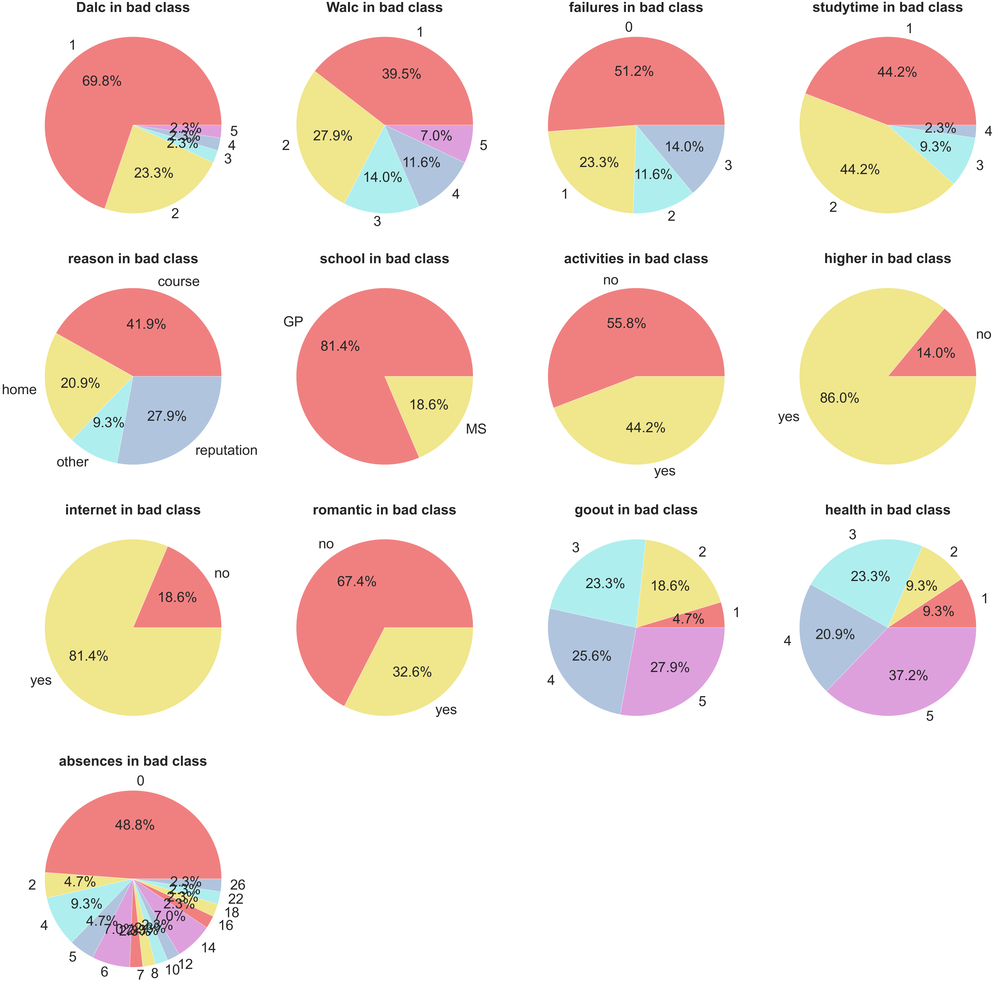

In [195]:
plt.figure(figsize=(60,60))

efforts = ['Dalc', 'Walc', 'failures', 'studytime', 'reason', 'school', 'activities',
           'higher', 'internet', 'romantic', 'goout', 'health', 'absences']
n=1
for i in efforts:
    plt.subplot(4,4,n, )
    data = bad[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':60})
    plt.title('{} in bad class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

__3.2 환경의 영역__

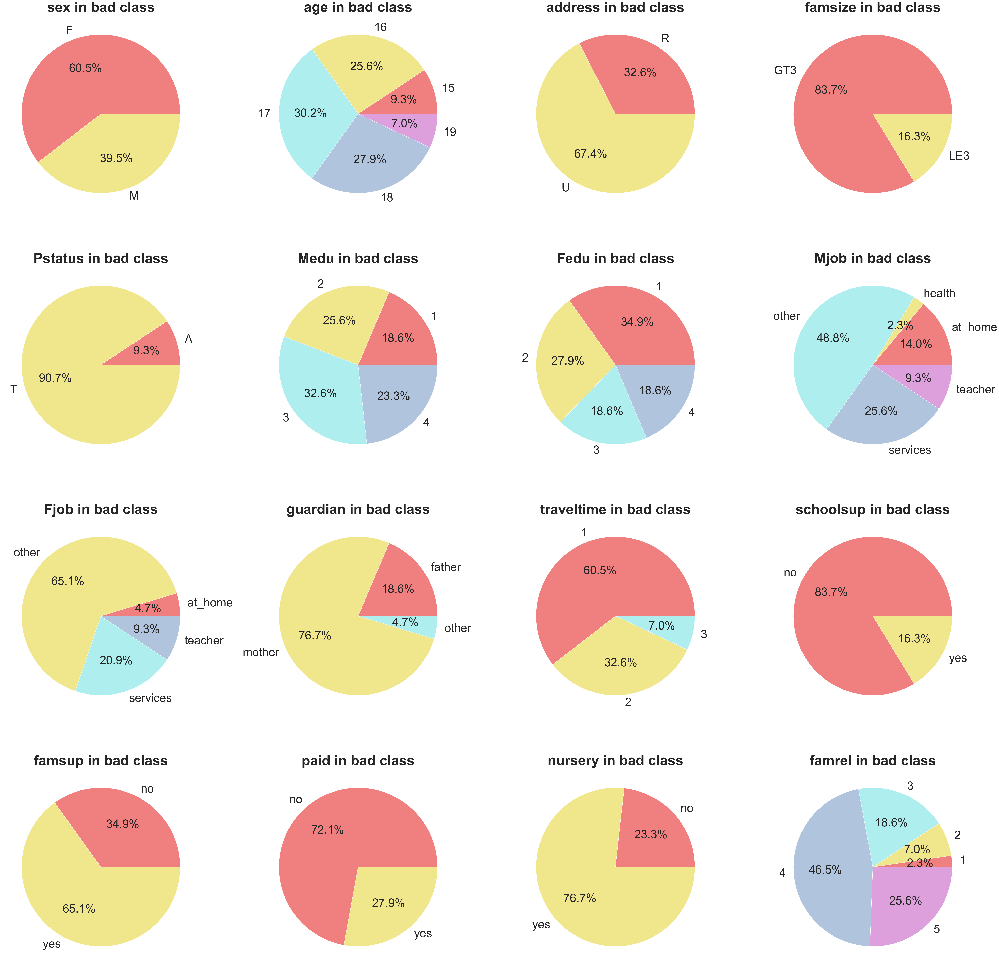

In [194]:
plt.figure(figsize=(60,60))

surrounding = ['sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
               'Mjob', 'Fjob', 'guardian', 'traveltime', 'schoolsup', 'famsup',
               'paid', 'nursery', 'famrel']
n=1
for i in surrounding:
    plt.subplot(4,4,n)
    data = bad[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':50})
    plt.title('{} in bad class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

## step4 excellent 학생 data 시각화

__4.0 excellent 학생 추출__

In [200]:
excellent = student_mat.loc[(student_mat['G1']>11) & (student_mat['G2']>11) & (student_mat['G3']>11)]
excellent.shape

(136, 33)

In [203]:
decreased_2 = student_mat.loc[(student_mat['G1']>11) & (student_mat['G2']<8) & (student_mat['G3']>11)]
decreased_2.shape

(0, 33)

In [204]:
decreased_3 = student_mat.loc[(student_mat['G1']>11) & (student_mat['G2']>11) & (student_mat['G3']<8)]
decreased_3.shape

(0, 33)

In [207]:
decreased_23 = student_mat.loc[(student_mat['G1']>11) & (student_mat['G2']<8) & (student_mat['G3']<8)]
decreased_23.shape

(1, 33)

신입생 때 성적이 우수했던 학생 중, 2학년 때만 성적이 떨어졌거나, 3학년 때만 성적이 떨어진 학생은 없으나, 신입생때만 공부 잘했던 학생 1명 있음.

__4.1 노력의 영역__

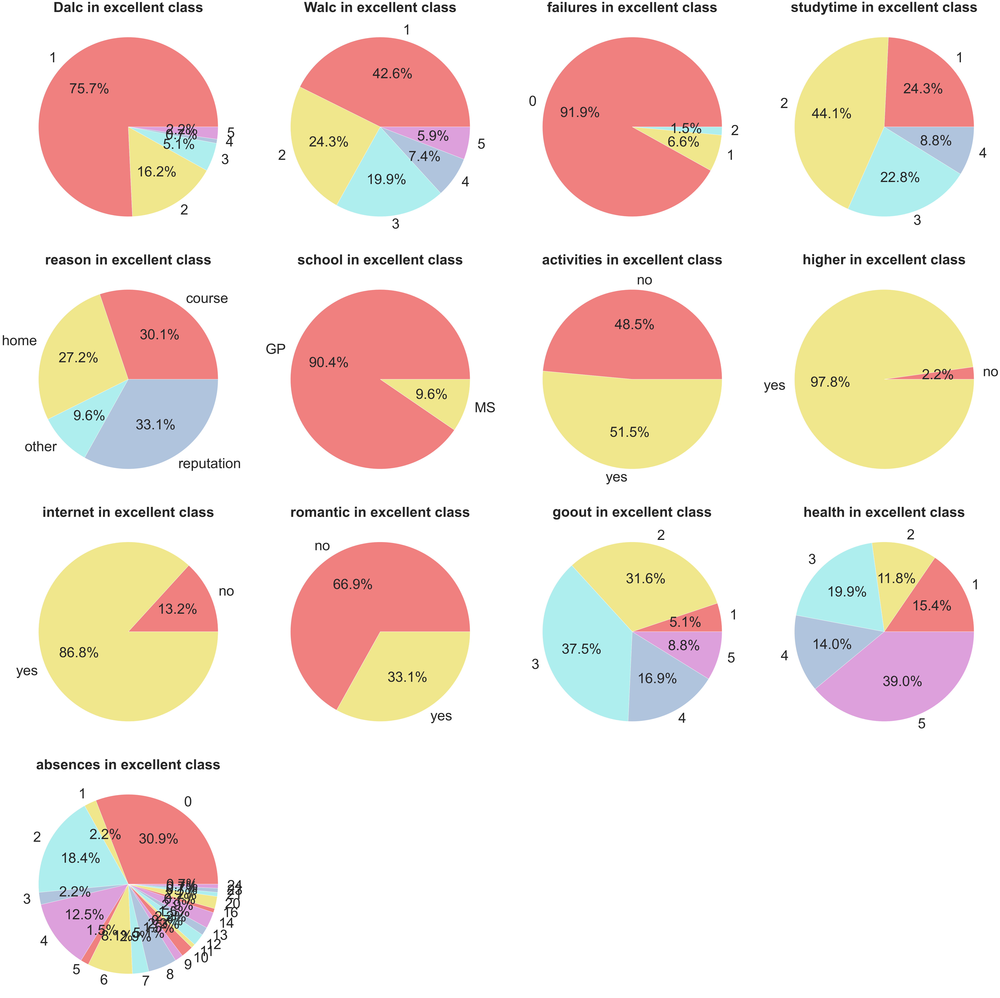

In [210]:
plt.figure(figsize=(60,60))

efforts = ['Dalc', 'Walc', 'failures', 'studytime', 'reason', 'school', 'activities',
           'higher', 'internet', 'romantic', 'goout', 'health', 'absences']
n=1
for i in efforts:
    plt.subplot(4,4,n, )
    data = excellent[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':60})
    plt.title('{} in excellent class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

__4.2 환경의 영역__

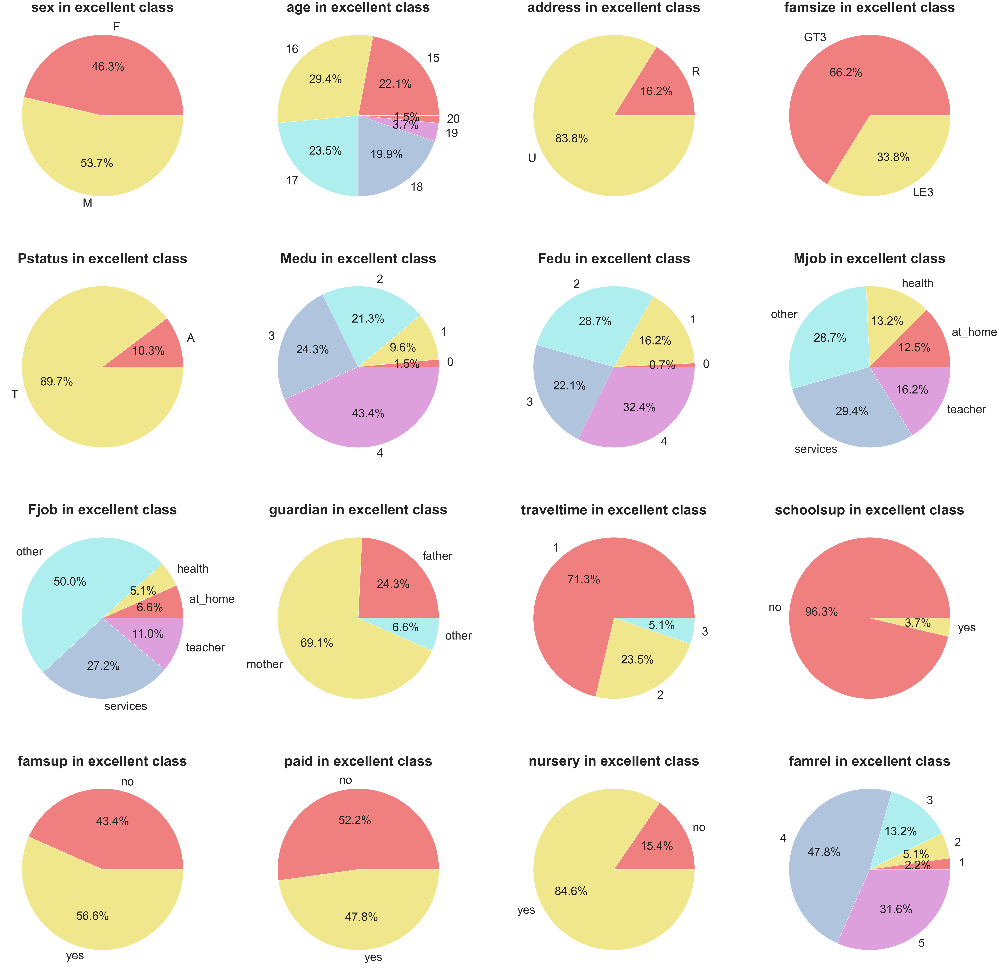

In [211]:
plt.figure(figsize=(60,60))

surrounding = ['sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
               'Mjob', 'Fjob', 'guardian', 'traveltime', 'schoolsup', 'famsup',
               'paid', 'nursery', 'famrel']
n=1
for i in surrounding:
    plt.subplot(4,4,n)
    data = excellent[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':50})
    plt.title('{} in excellent class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

## student_mat 데이터 분석 결과

1. 노력의 영역에 해당하는 feature가 환경에 해당하는 feature보다 성적에 영향을 많이 끼친다.
<br>
2. 눈에 띄게 다른 점
    * Dalc, Walc : 술 소비량이 크게 차이나지는 않지만 excellent학생의“술을 많이 마시는 경우(4~5)” 비율이 좀 더 낮음
    * 낙제(failures) 횟수 :“0” 51.2 => 91.9 % // “1” 23.3 => 6.6 %
    - Studytime : 일주일에 최소5시간, 최대 10시간 이상 공부에 투자하는 비율이 높음. 11.5  31.6 %
    - Goout : “1~3” 비율 46% => 74.2%
    - Absences:“0~4” 62.8 % => 66.2 %
    - Higher :“yes” 86 => 97.8
<br>   
3. 특이사항
    * Health : 건강 비율이 비슷함.
4. 성적과 무관한 feature
    - Reason
    - School
    - activities
    - internet
    - romantic
    - activities

---
# Student_por data 살펴보기

## step1 bad & excellent 학생 데이터 추출

In [213]:
student_por.shape

(649, 33)

In [215]:
bad_por = student_por[(student_por['G1'] < 8) & (student_por['G2'] < 8) & (student_por['G3'] < 8)]
bad_por.shape

(14, 33)

In [217]:
increased_por_2 = student_por[(student_por['G1'] < 8) & (student_por['G2'] > 11) & (student_por['G3'] < 8)]
increased_por_2.shape

(0, 33)

In [218]:
increased_por_3 = student_por[(student_por['G1'] < 8) & (student_por['G2'] < 8) & (student_por['G3'] > 11)]
increased_por_3.shape

(0, 33)

In [219]:
increased_por_23 = student_por[(student_por['G1'] < 8) & (student_por['G2'] > 11) & (student_por['G3'] > 11)]
increased_por_23.shape

(0, 33)

성적이 매우 낮은 학생 비율이 매우 적음 (2%). 성적이 향상된 경우 없음.

In [223]:
excellent_por = student_por[(student_por['G1'] > 11) & (student_por['G2'] > 11) & (student_por['G3'] > 11)]
excellent_por.shape

(273, 33)

In [224]:
decreased_por_2 = student_por[(student_por['G1'] > 11) & (student_por['G2'] < 8) & (student_por['G3'] > 11)]
decreased_por_2.shape

(0, 33)

In [225]:
decreased_por_3 = student_por[(student_por['G1'] > 11) & (student_por['G2'] >11 ) & (student_por['G3'] < 8)]
decreased_por_3.shape

(0, 33)

In [226]:
decreased_por_23 = student_por[(student_por['G1'] > 11) & (student_por['G2'] < 8 ) & (student_por['G3'] < 8)]
decreased_por_23.shape

(0, 33)

성적이 우수한 학생 비율은 42%. 포르투갈어를 듣는 학생은 중위권과 상위권이 대부분을 차지하고 있음.

## step2 bad 학생들의 feature 분석 및 시각화

__노력의 영역__

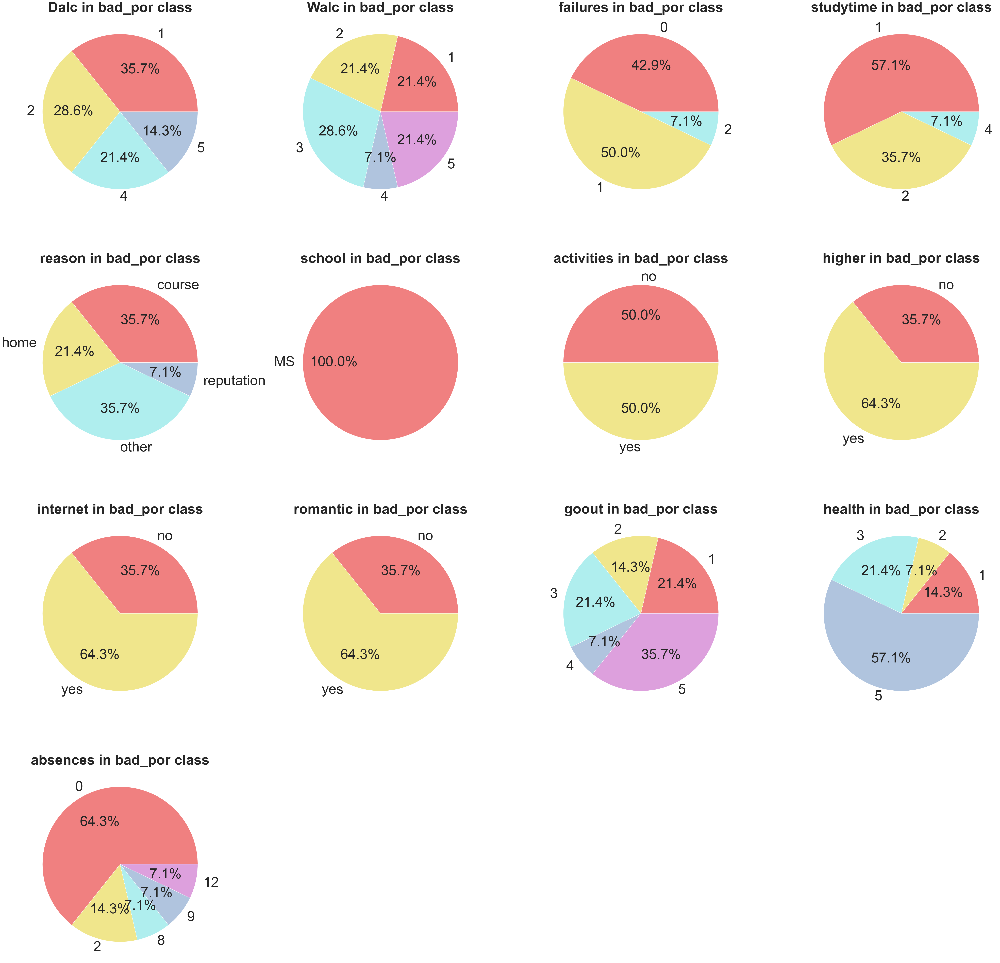

In [227]:
plt.figure(figsize=(60,60))

efforts = ['Dalc', 'Walc', 'failures', 'studytime', 'reason', 'school', 'activities',
           'higher', 'internet', 'romantic', 'goout', 'health', 'absences']
n=1
for i in efforts:
    plt.subplot(4,4,n)
    data = bad_por[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':60})
    plt.title('{} in bad_por class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

__환경의 영역__

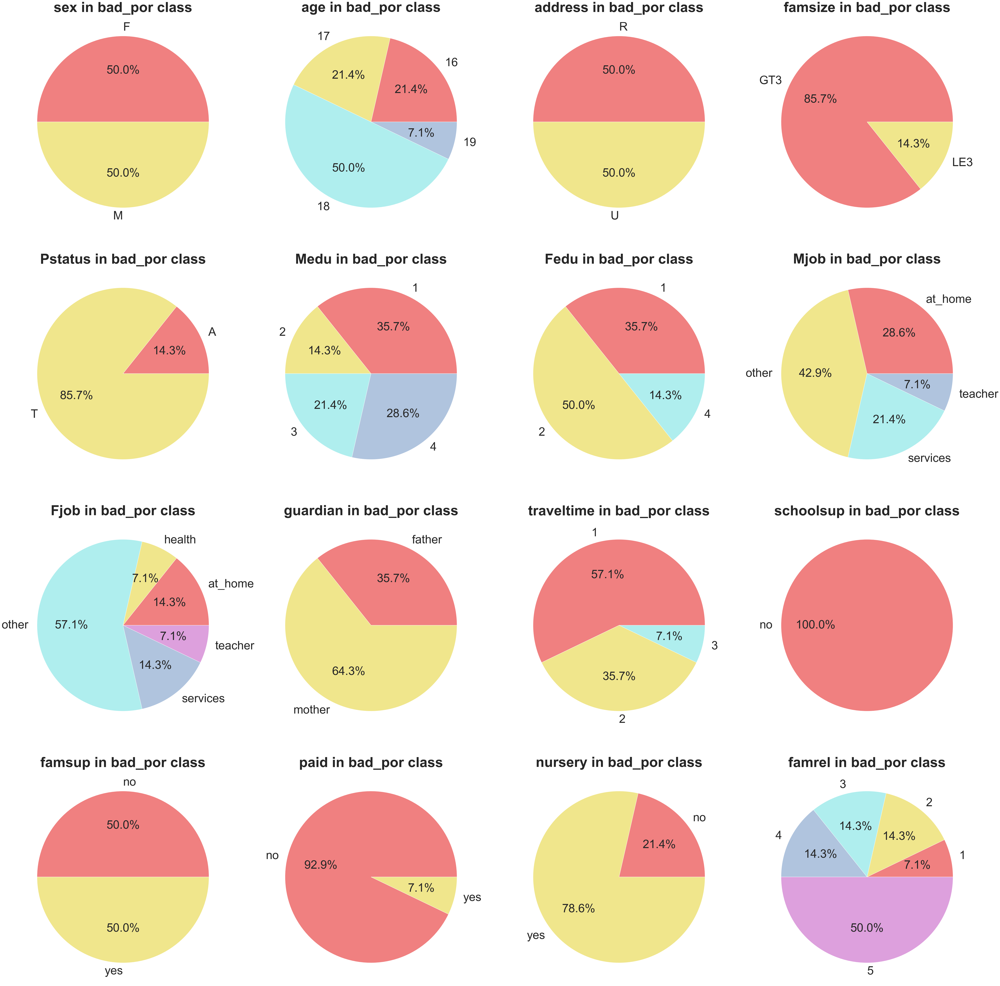

In [228]:
plt.figure(figsize=(60,60))

surrounding = ['sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
               'Mjob', 'Fjob', 'guardian', 'traveltime', 'schoolsup', 'famsup',
               'paid', 'nursery', 'famrel']
n=1
for i in surrounding:
    plt.subplot(4,4,n)
    data = bad_por[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':50})
    plt.title('{} in bad_por class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

## step3 excellent 학생들의 feature 분석 및 시각화

__노력의 영역__

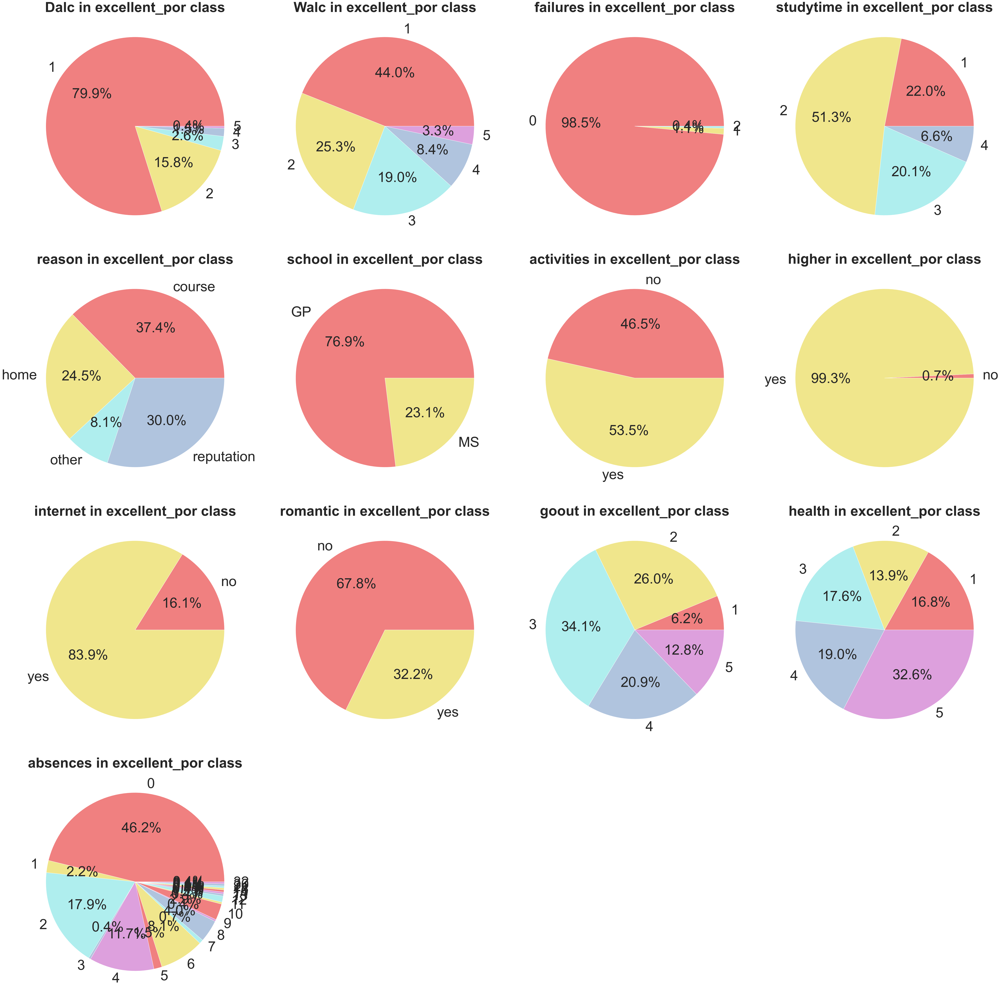

In [229]:
plt.figure(figsize=(60,60))

efforts = ['Dalc', 'Walc', 'failures', 'studytime', 'reason', 'school', 'activities',
           'higher', 'internet', 'romantic', 'goout', 'health', 'absences']
n=1
for i in efforts:
    plt.subplot(4,4,n)
    data = excellent_por[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':60})
    plt.title('{} in excellent_por class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

__환경의 영역__

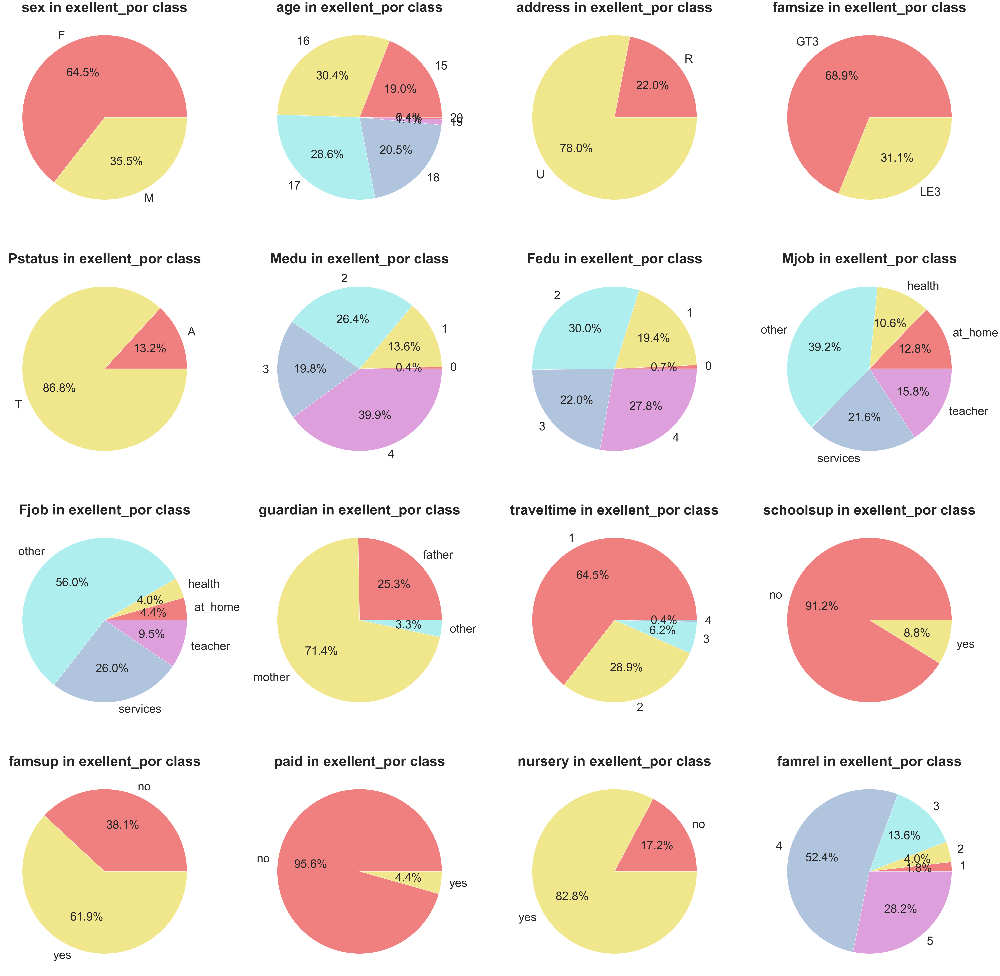

In [230]:
plt.figure(figsize=(60,60))

surrounding = ['sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu', 'Fedu',
               'Mjob', 'Fjob', 'guardian', 'traveltime', 'schoolsup', 'famsup',
               'paid', 'nursery', 'famrel']
n=1
for i in surrounding:
    plt.subplot(4,4,n)
    data = excellent_por[i].value_counts().sort_index()
    labels=data.index
    plt.pie(data, labels=labels, autopct = '%.1f%%', 
            colors=['lightcoral', 'khaki', 'paleturquoise', 'lightsteelblue', 'plum'],
            textprops={'size':50})
    plt.title('{} in exellent_por class'.format(i), fontsize=60, fontweight='bold')
    n += 1
plt.tight_layout()
plt.show()
    

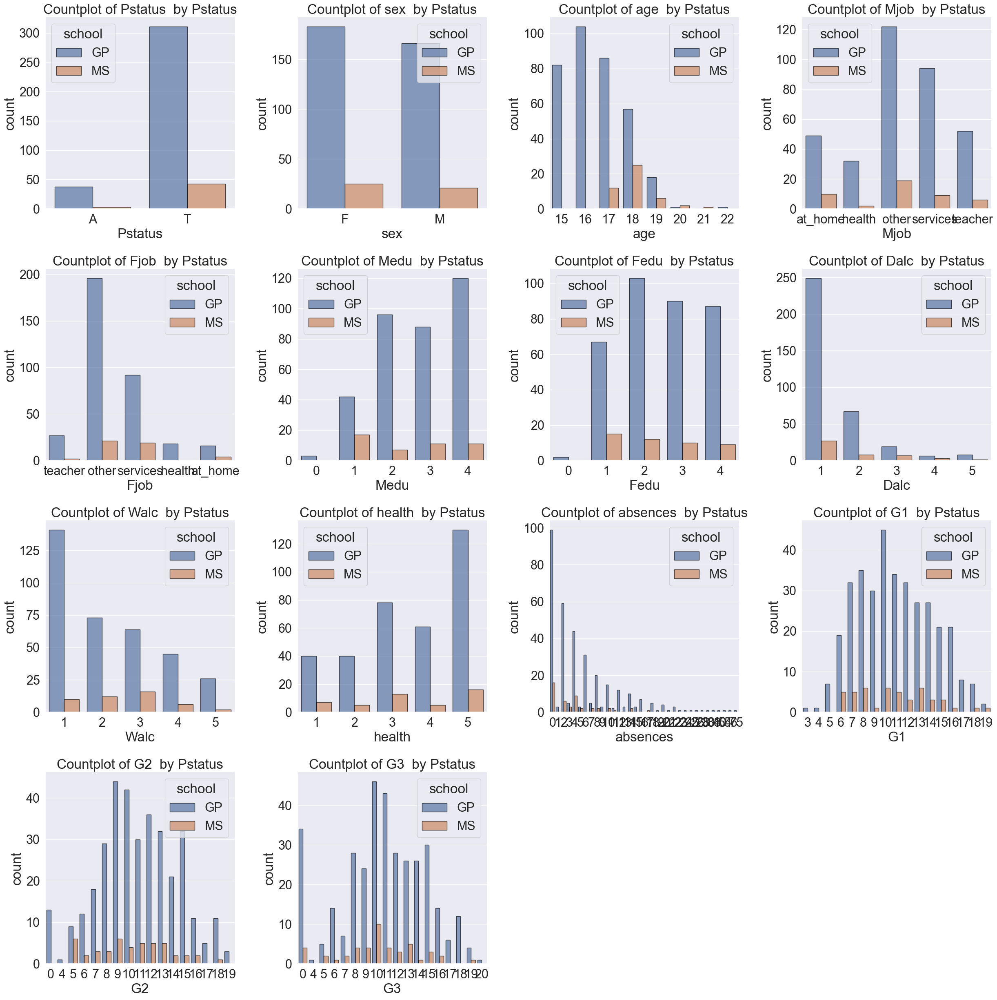

In [69]:
plt.figure(figsize=[25,25])
fft=['Pstatus','sex','age','Mjob','Fjob','Medu','Fedu','Dalc','Walc','health','absences','G1','G2','G3']
n=1
for f in fft:
    plt.subplot(4,4,n)
    sns.countplot(x=f, hue='school', edgecolor="black", alpha=0.7, data=student_mat)
    sns.despine()
    plt.title("Countplot of {}  by Pstatus".format(f), fontsize=)
    n=n+1
plt.tight_layout()
plt.show()

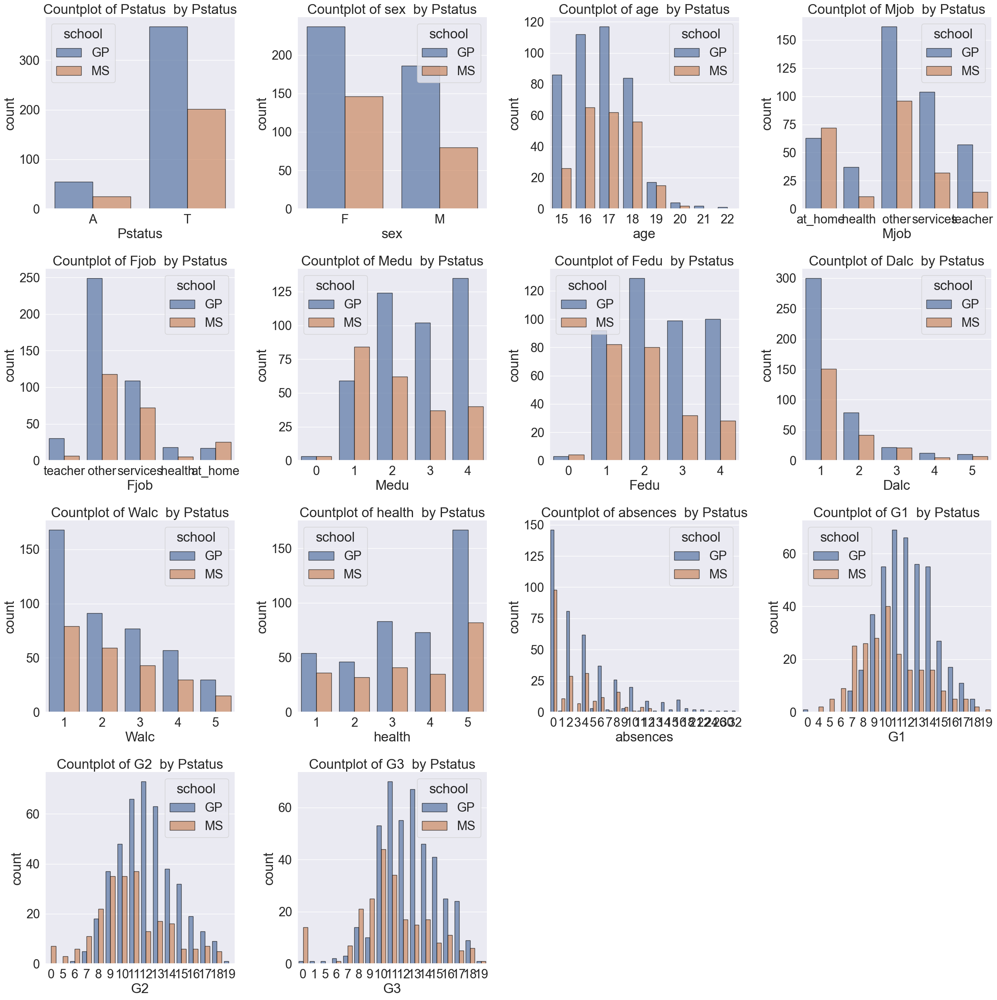

In [70]:
plt.figure(figsize=[25,25])
fft=['Pstatus','sex','age','Mjob','Fjob','Medu','Fedu','Dalc','Walc','health','absences','G1','G2','G3']
n=1
for f in fft:
    plt.subplot(4,4,n)
    sns.countplot(x=f, hue='school', edgecolor="black", alpha=0.7, data=student_por)
    sns.despine()
    plt.title("Countplot of {}  by Pstatus".format(f))
    n=n+1
plt.tight_layout()
plt.show()

__학생이 처한 환경이 학생의 주류 소비 행태에 미치는 영향__

In [71]:
surround =['school', 'address', 'Pstatus', 'Medu', 'Fedu', 'Mjob', 'Fjob',
'guardian', 'traveltime', 'schoolsup', 'famsup', 'internet','romantic',
'famrel']

In [ ]:
effects = ['studytime', 'failurs', 'paid', 'activities', 'nersery', 'higher',
'freetime', 'goout', 'health', 'absences', 'G1', 'G2', 'G3']

In [ ]:
target = 'Dalc' &/| 'Walc'

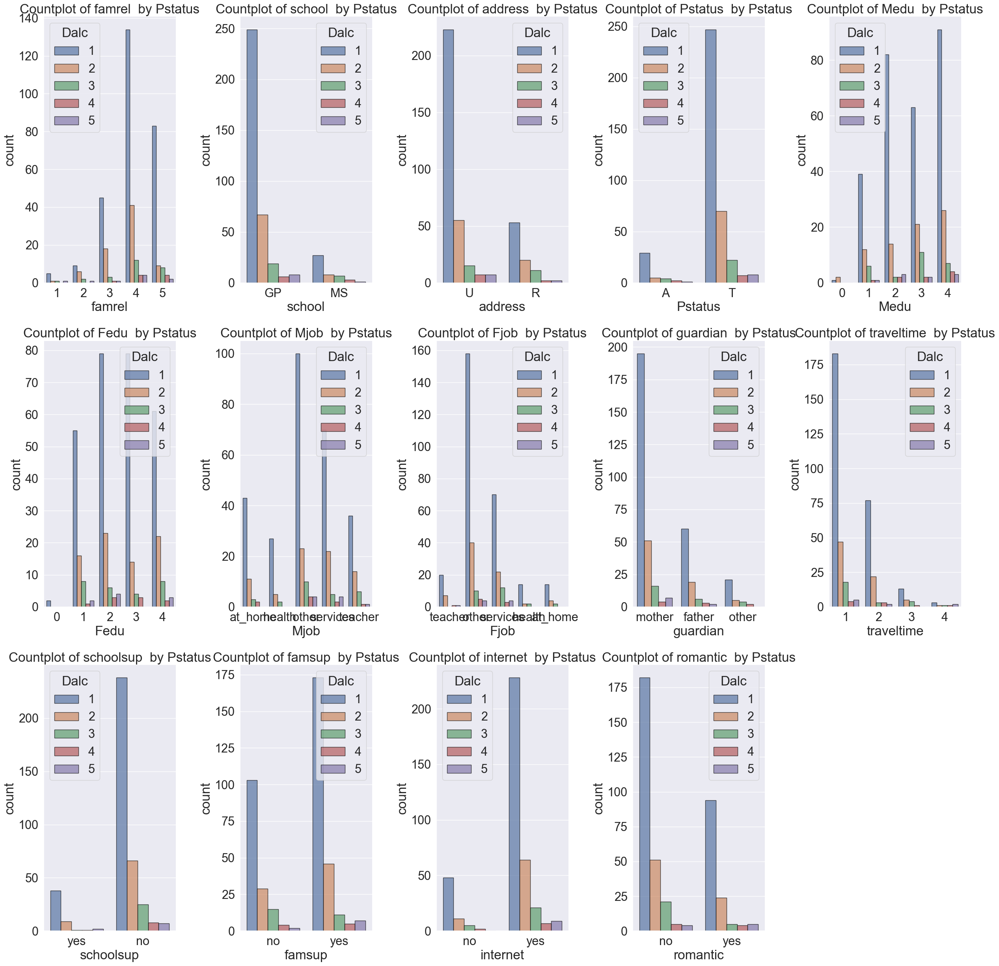

In [73]:
plt.figure(figsize=[25,25])
surround =['school', 'address', 'Pstatus', 'Medu', 'Fedu', 'Mjob', 'Fjob',
'guardian', 'traveltime', 'schoolsup', 'famsup', 'internet','romantic',
'famrel']
n=1
for i in range(len(surround)):
    plt.subplot(3,5,n)
    sns.countplot(x=surround[i-1], hue='Dalc', edgecolor="black", alpha=0.7, data=student_mat)
    sns.despine()
    plt.title("Countplot of {}  by Pstatus".format(surround[i-1]))
    n=n+1
plt.tight_layout()
plt.show()

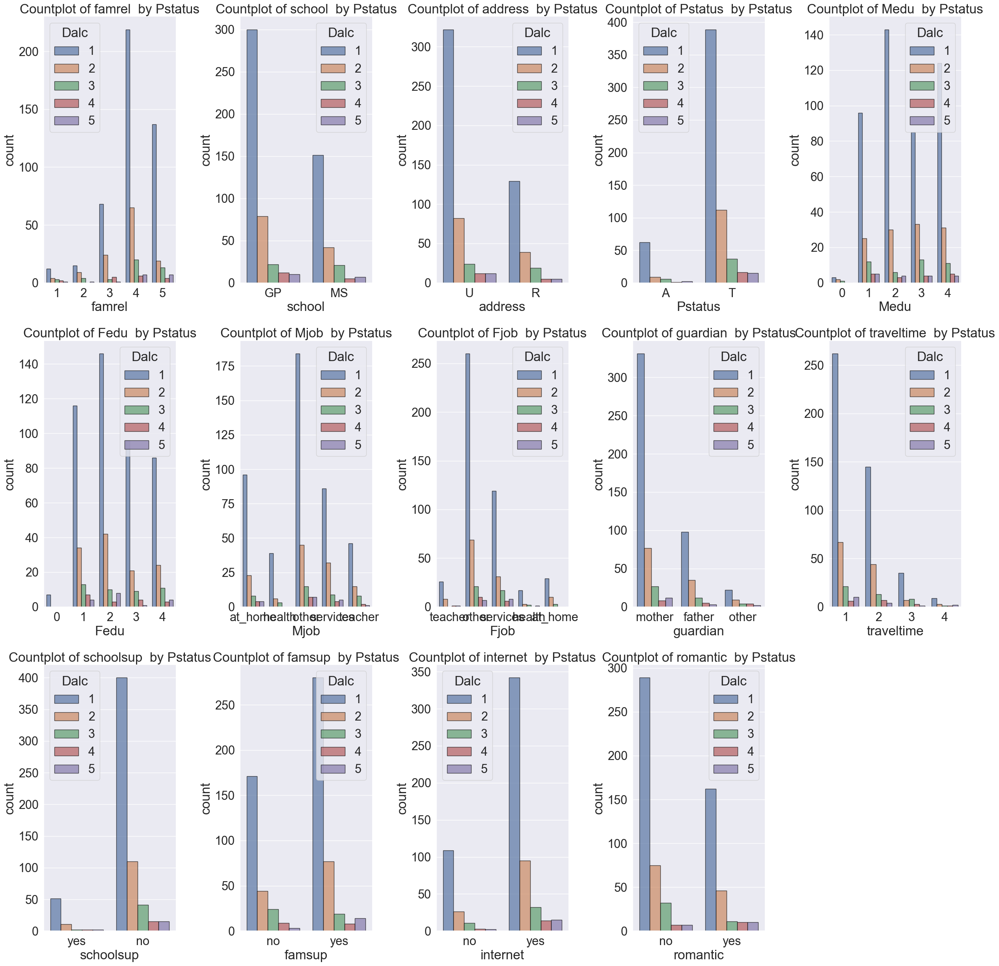

In [74]:
plt.figure(figsize=[25,25])
surround =['school', 'address', 'Pstatus', 'Medu', 'Fedu', 'Mjob', 'Fjob',
'guardian', 'traveltime', 'schoolsup', 'famsup', 'internet','romantic',
'famrel']
n=1
for i in range(len(surround)):
    plt.subplot(3,5,n)
    sns.countplot(x=surround[i-1], hue='Dalc', edgecolor="black", alpha=0.7, data=student_por)
    sns.despine()
    plt.title("Countplot of {}  by Pstatus".format(surround[i-1]))
    n=n+1
plt.tight_layout()
plt.show()

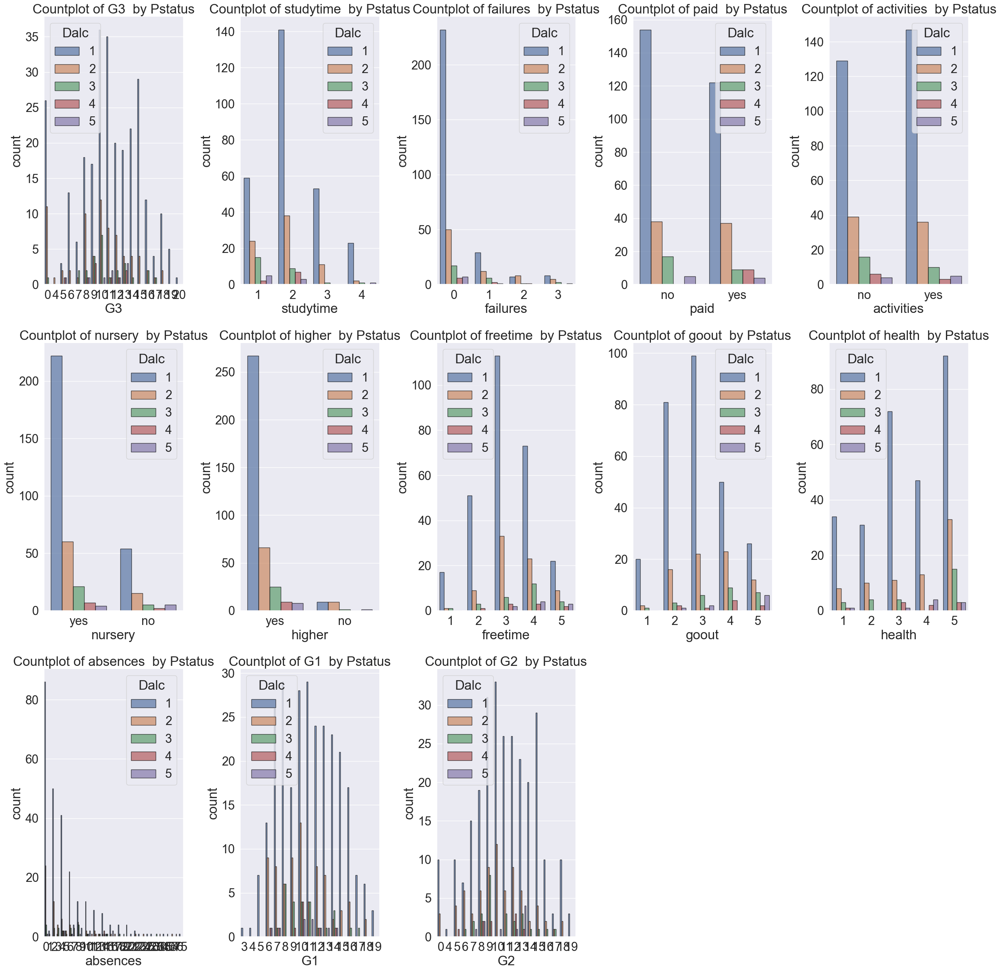

In [77]:
plt.figure(figsize=[25,25])

effects = ['studytime', 'failures', 'paid', 'activities', 'nursery', 'higher',
'freetime', 'goout', 'health', 'absences', 'G1', 'G2', 'G3']

n=1
for i in range(len(effects)):
    plt.subplot(3,5,n)
    sns.countplot(x=effects[i-1], hue='Dalc', edgecolor="black", alpha=0.7, data=student_mat)
    sns.despine()
    plt.title("Countplot of {}  by Pstatus".format(effects[i-1]))
    n=n+1
plt.tight_layout()
plt.show()

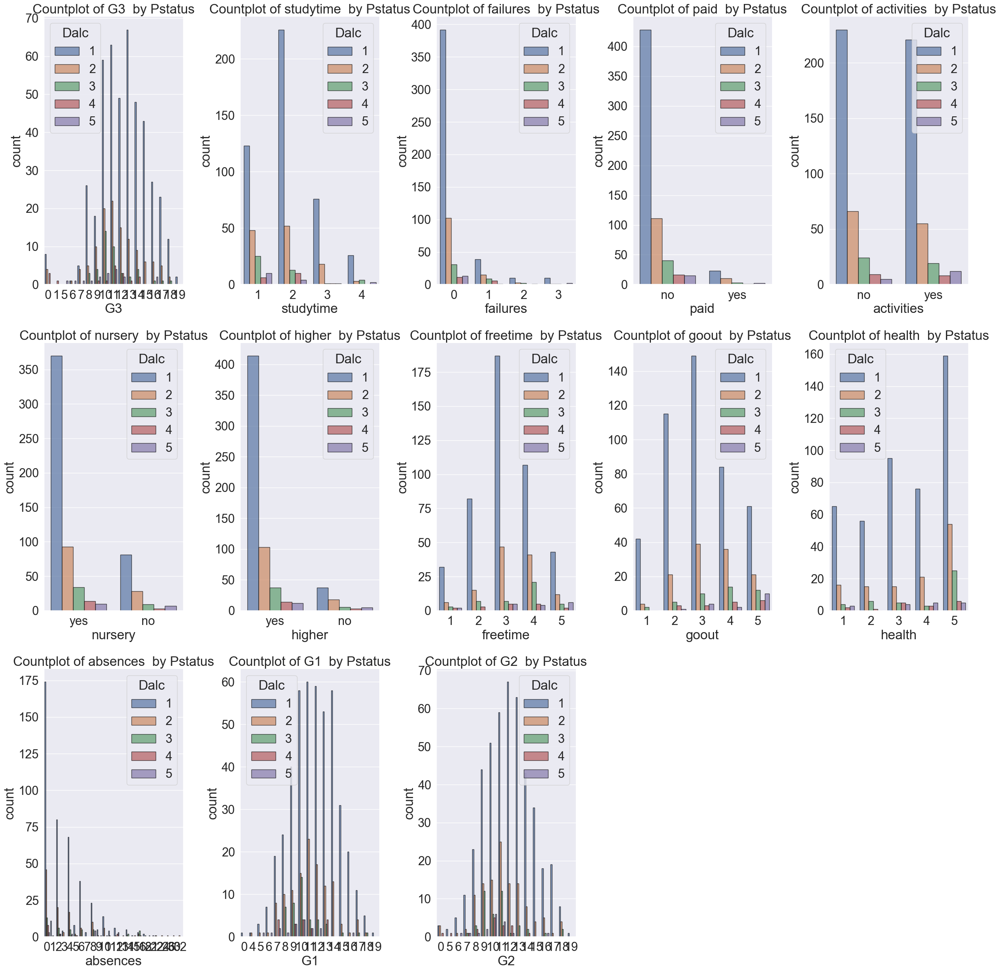

In [78]:
plt.figure(figsize=[25,25])

effects = ['studytime', 'failures', 'paid', 'activities', 'nursery', 'higher',
'freetime', 'goout', 'health', 'absences', 'G1', 'G2', 'G3']

n=1
for i in range(len(effects)):
    plt.subplot(3,5,n)
    sns.countplot(x=effects[i-1], hue='Dalc', edgecolor="black", alpha=0.7, data=student_por)
    sns.despine()
    plt.title("Countplot of {}  by Pstatus".format(effects[i-1]))
    n=n+1
plt.tight_layout()
plt.show()